In [2]:
%pip install nltk spacy pymorphy2 pymorphy2-dicts pymystem3 pandas matplotlib wordcloud
%pip install spacy[ru]


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import nltk
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
from nltk.stem import SnowballStemmer
from nltk.tokenize import WordPunctTokenizer
from nltk.tokenize import RegexpTokenizer
from pymystem3 import Mystem
import pandas as pd
import matplotlib
import wordcloud
import spacy
from spacy import displacy

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Ustin\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Ustin\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Ustin\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


## Живая шляпа

In [4]:
with open("57373677.txt") as file:
    text = file.read()
wordpunct = nltk.tokenize.WordPunctTokenizer()
print(wordpunct.tokenize(text))

['Живая', 'шляпа', 'Николай', 'Николаевич', 'Носов', 'Классика', 'нашего', 'детства', 'Рассказы', ',', 'как', 'и', 'все', 'произведения', 'Николая', 'Носова', ',', 'давно', 'стали', 'не', 'только', 'классикой', ',', 'но', 'и', ',', 'без', 'преувеличения', ',', 'национальным', 'достоянием', '.', 'В', 'нашей', 'стране', 'нет', 'ни', 'одного', 'человека', ',', 'который', 'бы', 'не', 'читал', 'в', 'детстве', 'про', 'живую', 'шляпу', 'и', 'Мишкину', 'кашу', ',', 'про', 'фантазёров', 'или', 'Бобика', 'в', 'гостях', 'у', 'Барбоса', '…', 'Герои', 'рассказов', 'Носова', '–', 'такие', 'же', 'живые', 'и', 'настоящие', ',', 'как', 'и', 'любой', 'соседский', 'мальчишка', 'или', 'девчонка', '.', 'Они', 'так', 'же', 'учатся', 'в', 'школе', ',', 'играют', 'и', 'проказничают', ',', 'так', 'же', 'радуются', 'и', 'грустят', ',', 'ссорятся', 'и', 'мирятся', '.', 'С', 'детства', 'любимые', 'рассказы', 'Николая', 'Носова', 'прекрасно', 'проиллюстрированы', 'замечательными', 'рисунками', 'Германа', 'Огородни

In [5]:
with open("57373677.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized

['Живая',
 'шляпа',
 'Николай',
 'Николаевич',
 'Носов',
 'Классика',
 'нашего',
 'детства',
 'Рассказы',
 ',',
 'как',
 'и',
 'все',
 'произведения',
 'Николая',
 'Носова',
 ',',
 'давно',
 'стали',
 'не',
 'только',
 'классикой',
 ',',
 'но',
 'и',
 ',',
 'без',
 'преувеличения',
 ',',
 'национальным',
 'достоянием',
 '.',
 'В',
 'нашей',
 'стране',
 'нет',
 'ни',
 'одного',
 'человека',
 ',',
 'который',
 'бы',
 'не',
 'читал',
 'в',
 'детстве',
 'про',
 'живую',
 'шляпу',
 'и',
 'Мишкину',
 'кашу',
 ',',
 'про',
 'фантазёров',
 'или',
 'Бобика',
 'в',
 'гостях',
 'у',
 'Барбоса…',
 'Герои',
 'рассказов',
 'Носова',
 '–',
 'такие',
 'же',
 'живые',
 'и',
 'настоящие',
 ',',
 'как',
 'и',
 'любой',
 'соседский',
 'мальчишка',
 'или',
 'девчонка',
 '.',
 'Они',
 'так',
 'же',
 'учатся',
 'в',
 'школе',
 ',',
 'играют',
 'и',
 'проказничают',
 ',',
 'так',
 'же',
 'радуются',
 'и',
 'грустят',
 ',',
 'ссорятся',
 'и',
 'мирятся',
 '.',
 'С',
 'детства',
 'любимые',
 'рассказы',
 'Никол

In [6]:
tagged = nltk.pos_tag(tokenized)
tagged

[('Живая', 'JJ'),
 ('шляпа', 'NNP'),
 ('Николай', 'NNP'),
 ('Николаевич', 'NNP'),
 ('Носов', 'NNP'),
 ('Классика', 'NNP'),
 ('нашего', 'NNP'),
 ('детства', 'NNP'),
 ('Рассказы', 'NNP'),
 (',', ','),
 ('как', 'NNP'),
 ('и', 'NNP'),
 ('все', 'NNP'),
 ('произведения', 'NNP'),
 ('Николая', 'NNP'),
 ('Носова', 'NNP'),
 (',', ','),
 ('давно', 'NNP'),
 ('стали', 'NNP'),
 ('не', 'NNP'),
 ('только', 'NNP'),
 ('классикой', 'NNP'),
 (',', ','),
 ('но', 'NNP'),
 ('и', 'NNP'),
 (',', ','),
 ('без', 'NNP'),
 ('преувеличения', 'NNP'),
 (',', ','),
 ('национальным', 'NNP'),
 ('достоянием', 'NNP'),
 ('.', '.'),
 ('В', 'VB'),
 ('нашей', 'JJ'),
 ('стране', 'NNP'),
 ('нет', 'NNP'),
 ('ни', 'NNP'),
 ('одного', 'NNP'),
 ('человека', 'NNP'),
 (',', ','),
 ('который', 'NNP'),
 ('бы', 'NNP'),
 ('не', 'NNP'),
 ('читал', 'NNP'),
 ('в', 'NNP'),
 ('детстве', 'NNP'),
 ('про', 'NNP'),
 ('живую', 'NNP'),
 ('шляпу', 'NNP'),
 ('и', 'NNP'),
 ('Мишкину', 'NNP'),
 ('кашу', 'NNP'),
 (',', ','),
 ('про', 'NNP'),
 ('фантазёр

In [7]:
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()
lemmatized = [lemm.lemmatize(word) for word in tokenized]
lemmatized

['Живая',
 'шляпа',
 'Николай',
 'Николаевич',
 'Носов',
 'Классика',
 'нашего',
 'детства',
 'Рассказы',
 ',',
 'как',
 'и',
 'все',
 'произведения',
 'Николая',
 'Носова',
 ',',
 'давно',
 'стали',
 'не',
 'только',
 'классикой',
 ',',
 'но',
 'и',
 ',',
 'без',
 'преувеличения',
 ',',
 'национальным',
 'достоянием',
 '.',
 'В',
 'нашей',
 'стране',
 'нет',
 'ни',
 'одного',
 'человека',
 ',',
 'который',
 'бы',
 'не',
 'читал',
 'в',
 'детстве',
 'про',
 'живую',
 'шляпу',
 'и',
 'Мишкину',
 'кашу',
 ',',
 'про',
 'фантазёров',
 'или',
 'Бобика',
 'в',
 'гостях',
 'у',
 'Барбоса…',
 'Герои',
 'рассказов',
 'Носова',
 '–',
 'такие',
 'же',
 'живые',
 'и',
 'настоящие',
 ',',
 'как',
 'и',
 'любой',
 'соседский',
 'мальчишка',
 'или',
 'девчонка',
 '.',
 'Они',
 'так',
 'же',
 'учатся',
 'в',
 'школе',
 ',',
 'играют',
 'и',
 'проказничают',
 ',',
 'так',
 'же',
 'радуются',
 'и',
 'грустят',
 ',',
 'ссорятся',
 'и',
 'мирятся',
 '.',
 'С',
 'детства',
 'любимые',
 'рассказы',
 'Никол

In [8]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('C'):
        return nltk.corpus.wordnet.CD
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Живая', 'JJ'),
 ('шляпа', 'NNP'),
 ('Николай', 'NNP'),
 ('Николаевич', 'NNP'),
 ('Носов', 'NNP'),
 ('Классика', 'NNP'),
 ('нашего', 'NNP'),
 ('детства', 'NNP'),
 ('Рассказы', 'NNP'),
 (',', ','),
 ('как', 'NNP'),
 ('и', 'NNP'),
 ('все', 'NNP'),
 ('произведения', 'NNP'),
 ('Николая', 'NNP'),
 ('Носова', 'NNP'),
 (',', ','),
 ('давно', 'NNP'),
 ('стали', 'NNP'),
 ('не', 'NNP'),
 ('только', 'NNP'),
 ('классикой', 'NNP'),
 (',', ','),
 ('но', 'NNP'),
 ('и', 'NNP'),
 (',', ','),
 ('без', 'NNP'),
 ('преувеличения', 'NNP'),
 (',', ','),
 ('национальным', 'NNP'),
 ('достоянием', 'NNP'),
 ('.', '.'),
 ('В', 'VB'),
 ('нашей', 'JJ'),
 ('стране', 'NNP'),
 ('нет', 'NNP'),
 ('ни', 'NNP'),
 ('одного', 'NNP'),
 ('человека', 'NNP'),
 (',', ','),
 ('который', 'NNP'),
 ('бы', 'NNP'),
 ('не', 'NNP'),
 ('читал', 'NNP'),
 ('в', 'NNP'),
 ('детстве', 'NNP'),
 ('про', 'NNP'),
 ('живую', 'NNP'),
 ('шляпу', 'NNP'),
 ('и', 'NNP'),
 ('Мишкину', 'NNP'),
 ('кашу', 'NNP'),
 (',', ','),
 ('про', 'NNP'),
 ('фантазёр

In [9]:
stemmer = SnowballStemmer(language='russian')
with open("57373677.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
stemmed = [stemmer.stem(word) for word in tokenized]
stemmed

['жив',
 'шляп',
 'никола',
 'николаевич',
 'нос',
 'классик',
 'наш',
 'детств',
 'рассказ',
 ',',
 'как',
 'и',
 'все',
 'произведен',
 'никол',
 'носов',
 ',',
 'давн',
 'стал',
 'не',
 'тольк',
 'классик',
 ',',
 'но',
 'и',
 ',',
 'без',
 'преувеличен',
 ',',
 'национальн',
 'достоян',
 '.',
 'в',
 'наш',
 'стран',
 'нет',
 'ни',
 'одн',
 'человек',
 ',',
 'котор',
 'бы',
 'не',
 'чита',
 'в',
 'детств',
 'про',
 'жив',
 'шляп',
 'и',
 'мишкин',
 'каш',
 ',',
 'про',
 'фантазер',
 'ил',
 'бобик',
 'в',
 'гост',
 'у',
 'барбоса…',
 'геро',
 'рассказ',
 'носов',
 '–',
 'так',
 'же',
 'жив',
 'и',
 'настоя',
 ',',
 'как',
 'и',
 'люб',
 'соседск',
 'мальчишк',
 'ил',
 'девчонк',
 '.',
 'он',
 'так',
 'же',
 'учат',
 'в',
 'школ',
 ',',
 'игра',
 'и',
 'проказнича',
 ',',
 'так',
 'же',
 'рад',
 'и',
 'груст',
 ',',
 'ссор',
 'и',
 'мир',
 '.',
 'с',
 'детств',
 'любим',
 'рассказ',
 'никол',
 'носов',
 'прекрасн',
 'проиллюстрирова',
 'замечательн',
 'рисунк',
 'герма',
 'огородников

In [10]:
SnowballStemmer(language="russian")

In [11]:
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("57373677.txt") as file:
    text = file.read()
    
type(text)

str

In [12]:
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("57373677.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized
morph.parse(text)

[Parse(word='живая шляпа\nниколай николаевич носов\n\n\nклассика нашего детства\nрассказы, как и все произведения николая носова, давно стали не только классикой, но и, без преувеличения, национальным достоянием. в нашей стране нет ни одного человека, который бы не читал в детстве про живую шляпу и мишкину кашу, про фантазёров или бобика в гостях у барбоса…\n\nгерои рассказов носова – такие же живые и настоящие, как и любой соседский мальчишка или девчонка. они так же учатся в школе, играют и проказничают, так же радуются и грустят, ссорятся и мирятся.\n\nс детства любимые рассказы николая носова прекрасно проиллюстрированы замечательными рисунками германа огородникова.\n\n\n\n\n\nниколай николаевич носов\n\nживая шляпа\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\n\nзатейники\n\n\n\n\n\nмы с\xa0валей затейники. мы всегда затеваем какие-нибудь игры.\n\nодин раз мы читали сказку «три поросёнка». а потом стали играть. сначала мы бегали по комнате, прыгали и кричали:\n\n–\xa0нам не страшен серый волк!\n

In [13]:
m=Mystem()
m.analyze('Жили-были три весёлых охотника: дядя Ваня, дядя Федя да дядя Кузьма. Вот пошли они в лес. Ходили, ходили, много разных зверушек видели, но никого не убили. И решили устроить привал: отдохнуть, значит. Уселись на зелёной лужайке и стали рассказывать друг другу разные интересные случаи.Первым рассказал охотник дядя Ваня.Вот послушайте, – сказал он. – Давно это было. Пошёл я как-то зимою в лес, а ружья у меня в ту пору не было: я тогда маленький был. Вдруг смотрю – волк. Огромный такой. Я от него бежать. А волк-то, видать, заметил, что я без ружья. Как побежит за мной!Ну думаю не удрать мне от него.Смотрю  дерево. Я на дерево. Волк хотел цапнуть меня, да не успел. Только штаны сзади зубами порвал. Залез я на дерево, сижу на ветке и трясусь от страха. А волк сидит внизу на снегу, поглядывает на меня и облизывается.Я думаю: «Ладно, посижу здесь до вечера. Ночью волчишка заснёт, я от него удеру».К вечеру, однако, ещё один волк пришёл. И стали они меня вдвоём караулить. Один волк спит, а другой стережёт, чтоб я не сбежал. Немного погодя пришёл третий волк. Потом ещё и ещё. И собралась под деревом целая волчья стая. Сидят все да зубами щёлкают на меня. Ждут, когда я свалюсь к ним сверху.Под утро мороз ударил. Градусов сорок. Руки-ноги у меня закоченели. Я не удержался на ветке. Бух вниз! Вся волчья стая как набросится на меня! Что-то как затрещит!«Ну, – думаю, – это кости мои трещат».')

[{'analysis': [{'lex': 'жить',
    'wt': 0.999995018,
    'gr': 'V,несов,нп=прош,мн,изъяв'}],
  'text': 'Жили'},
 {'text': '-'},
 {'analysis': [{'lex': 'быть',
    'wt': 0.9993722839,
    'gr': 'V,нп=прош,мн,изъяв,несов'}],
  'text': 'были'},
 {'text': ' '},
 {'analysis': [{'lex': 'три', 'wt': 0.9995156518, 'gr': 'NUM=(им|вин,неод)'}],
  'text': 'три'},
 {'text': ' '},
 {'analysis': [{'lex': 'веселый',
    'wt': 1,
    'gr': 'A=(пр,мн,полн|вин,мн,полн,од|род,мн,полн)'}],
  'text': 'весёлых'},
 {'text': ' '},
 {'analysis': [{'lex': 'охотник', 'wt': 1, 'gr': 'S,муж,од=(вин,ед|род,ед)'}],
  'text': 'охотника'},
 {'text': ': '},
 {'analysis': [{'lex': 'дядя', 'wt': 1, 'gr': 'S,муж,од=им,ед'}],
  'text': 'дядя'},
 {'text': ' '},
 {'analysis': [{'lex': 'ваня', 'wt': 1, 'gr': 'S,имя,муж,од=им,ед'}],
  'text': 'Ваня'},
 {'text': ', '},
 {'analysis': [{'lex': 'дядя', 'wt': 1, 'gr': 'S,муж,од=им,ед'}],
  'text': 'дядя'},
 {'text': ' '},
 {'analysis': [{'lex': 'федя', 'wt': 1, 'gr': 'S,имя,муж,од

In [14]:
m=Mystem()
m.analyze('Выбежал я из леса в одной майке и трусиках. Тут впереди речка и мостик через неё. Не успел я перебежать через мостик – как затрещит что-то! Оглянулся я, а это мостик под медведем рухнул. Медведь бултых в речку!«Ну, – думаю, – так тебе и надо, бродяга, чтоб не пугал людей зря».Только под мостиком было неглубоко. Медведь вылез на берег, отряхнулся как следует и в лес обратно ушёл.А я говорю сам себе:«Молодец, дядя Федя! Ловко медведя провёл! Только как мне теперь домой идти? На улице люди увидят, что я чуть ли не голышом, и на смех поднимут».И решил: посижу здесь в кусточках, а стемнеет, пойду потихоньку. Спрятался я в кустах и сидел там до вечера, а потом вылез и стал пробираться по улицам. Как только увижу, что кто-нибудь идёт навстречу, сейчас же шмыгну куда-нибудь за угол и сижу там в потёмках, чтоб на глаза не попадаться.')

[{'analysis': [{'lex': 'выбегать',
    'wt': 1,
    'gr': 'V,нп=прош,ед,изъяв,муж,сов'}],
  'text': 'Выбежал'},
 {'text': ' '},
 {'analysis': [{'lex': 'я', 'wt': 0.9999716281, 'gr': 'SPRO,ед,1-л=им'}],
  'text': 'я'},
 {'text': ' '},
 {'analysis': [{'lex': 'из', 'wt': 0.9999999775, 'gr': 'PR='}], 'text': 'из'},
 {'text': ' '},
 {'analysis': [{'lex': 'лес',
    'wt': 0.9901760075,
    'gr': 'S,муж,неод=(вин,мн|род,ед|им,мн)'}],
  'text': 'леса'},
 {'text': ' '},
 {'analysis': [{'lex': 'в', 'wt': 0.9999917878, 'gr': 'PR='}], 'text': 'в'},
 {'text': ' '},
 {'analysis': [{'lex': 'один',
    'wt': 0.7485076346,
    'gr': 'APRO=(пр,ед,жен|дат,ед,жен|род,ед,жен|твор,ед,жен)'}],
  'text': 'одной'},
 {'text': ' '},
 {'analysis': [{'lex': 'майка',
    'wt': 0.809853364,
    'gr': 'S,жен,неод=(пр,ед|дат,ед)'}],
  'text': 'майке'},
 {'text': ' '},
 {'analysis': [{'lex': 'и', 'wt': 0.9999770357, 'gr': 'CONJ='}], 'text': 'и'},
 {'text': ' '},
 {'analysis': [{'lex': 'трусик',
    'wt': 0.002070754359

In [15]:
import string

class Tokenizer:
    @staticmethod
    def tokenizer(text):
        translator = str.maketrans('', '', string.punctuation)
        text = text.translate(translator)
        tokens = text.split()

        return tokens

In [16]:
import spacy
nlp = spacy.load('ru_core_news_sm')

def remove_stopwords(text):
    nlp = spacy.load('ru_core_news_sm')
    doc = nlp(text)
    words = [token.text for token in doc if not token.is_stop and token.pos_ not in {'ADP', 'PRON', 'PART'}]
    filtered_text = ' '.join(words)

    return filtered_text


with open("57373677.txt") as file:
    text = file.read()
filtered_text = remove_stopwords(text)
print(filtered_text)

Живая шляпа 
 Николай Николаевич Носов 


 Классика детства 
 Рассказы , произведения Николая Носова , классикой , , преувеличения , национальным достоянием . стране человека , читал детстве живую шляпу Мишкину кашу , фантазёров Бобика гостях Барбоса … 

 Герои рассказов Носова – живые , соседский мальчишка девчонка . учатся школе , играют проказничают , радуются грустят , ссорятся мирятся . 

 детства любимые рассказы Николая Носова прекрасно проиллюстрированы замечательными рисунками Германа Огородникова . 





 Николай Николаевич Носов 

 Живая шляпа 
















 Затейники 





   Валей затейники . затеваем - игры . 

 раз читали сказку « Три поросёнка » . играть . бегали комнате , прыгали кричали : 

 –   страшен серый волк ! 

 мама ушла магазин ,   Валя сказала : 

 –   Давай , Петя , сделаем домик , поросят , сказке . 

 стащили кровати одеяло завесили стол . получился дом . залезли , темно - темно ! 

 Валя говорит : 

 –   , дом ! жить пустим , серый волк придёт , прого

In [17]:
with open("57373677.txt") as file:
    text = file.read()
tokenizer = Tokenizer()
tokens = tokenizer.tokenizer(text)
print(tokens)
m=Mystem()
m.analyze('Жили-были три весёлых охотника: дядя Ваня, дядя Федя да дядя Кузьма. Вот пошли они в лес. Ходили, ходили, много разных зверушек видели, но никого не убили. И решили устроить привал: отдохнуть, значит. Уселись на зелёной лужайке и стали рассказывать друг другу разные интересные случаи.Первым рассказал охотник дядя Ваня.Вот послушайте, – сказал он. – Давно это было. Пошёл я как-то зимою в лес, а ружья у меня в ту пору не было: я тогда маленький был. Вдруг смотрю – волк. Огромный такой. Я от него бежать. А волк-то, видать, заметил, что я без ружья. Как побежит за мной!Ну думаю не удрать мне от него.Смотрю  дерево. Я на дерево. Волк хотел цапнуть меня, да не успел. Только штаны сзади зубами порвал. Залез я на дерево, сижу на ветке и трясусь от страха. А волк сидит внизу на снегу, поглядывает на меня и облизывается.Я думаю: «Ладно, посижу здесь до вечера. Ночью волчишка заснёт, я от него удеру».К вечеру, однако, ещё один волк пришёл. И стали они меня вдвоём караулить. Один волк спит, а другой стережёт, чтоб я не сбежал. Немного погодя пришёл третий волк. Потом ещё и ещё. И собралась под деревом целая волчья стая. Сидят все да зубами щёлкают на меня. Ждут, когда я свалюсь к ним сверху.Под утро мороз ударил. Градусов сорок. Руки-ноги у меня закоченели. Я не удержался на ветке. Бух вниз! Вся волчья стая как набросится на меня! Что-то как затрещит!«Ну, – думаю, – это кости мои трещат».')

['Живая', 'шляпа', 'Николай', 'Николаевич', 'Носов', 'Классика', 'нашего', 'детства', 'Рассказы', 'как', 'и', 'все', 'произведения', 'Николая', 'Носова', 'давно', 'стали', 'не', 'только', 'классикой', 'но', 'и', 'без', 'преувеличения', 'национальным', 'достоянием', 'В', 'нашей', 'стране', 'нет', 'ни', 'одного', 'человека', 'который', 'бы', 'не', 'читал', 'в', 'детстве', 'про', 'живую', 'шляпу', 'и', 'Мишкину', 'кашу', 'про', 'фантазёров', 'или', 'Бобика', 'в', 'гостях', 'у', 'Барбоса…', 'Герои', 'рассказов', 'Носова', '–', 'такие', 'же', 'живые', 'и', 'настоящие', 'как', 'и', 'любой', 'соседский', 'мальчишка', 'или', 'девчонка', 'Они', 'так', 'же', 'учатся', 'в', 'школе', 'играют', 'и', 'проказничают', 'так', 'же', 'радуются', 'и', 'грустят', 'ссорятся', 'и', 'мирятся', 'С', 'детства', 'любимые', 'рассказы', 'Николая', 'Носова', 'прекрасно', 'проиллюстрированы', 'замечательными', 'рисунками', 'Германа', 'Огородникова', 'Николай', 'Николаевич', 'Носов', 'Живая', 'шляпа', 'Затейники', 'М

[{'analysis': [{'lex': 'жить',
    'wt': 0.999995018,
    'gr': 'V,несов,нп=прош,мн,изъяв'}],
  'text': 'Жили'},
 {'text': '-'},
 {'analysis': [{'lex': 'быть',
    'wt': 0.9993722839,
    'gr': 'V,нп=прош,мн,изъяв,несов'}],
  'text': 'были'},
 {'text': ' '},
 {'analysis': [{'lex': 'три', 'wt': 0.9995156518, 'gr': 'NUM=(им|вин,неод)'}],
  'text': 'три'},
 {'text': ' '},
 {'analysis': [{'lex': 'веселый',
    'wt': 1,
    'gr': 'A=(пр,мн,полн|вин,мн,полн,од|род,мн,полн)'}],
  'text': 'весёлых'},
 {'text': ' '},
 {'analysis': [{'lex': 'охотник', 'wt': 1, 'gr': 'S,муж,од=(вин,ед|род,ед)'}],
  'text': 'охотника'},
 {'text': ': '},
 {'analysis': [{'lex': 'дядя', 'wt': 1, 'gr': 'S,муж,од=им,ед'}],
  'text': 'дядя'},
 {'text': ' '},
 {'analysis': [{'lex': 'ваня', 'wt': 1, 'gr': 'S,имя,муж,од=им,ед'}],
  'text': 'Ваня'},
 {'text': ', '},
 {'analysis': [{'lex': 'дядя', 'wt': 1, 'gr': 'S,муж,од=им,ед'}],
  'text': 'дядя'},
 {'text': ' '},
 {'analysis': [{'lex': 'федя', 'wt': 1, 'gr': 'S,имя,муж,од

In [18]:
import re 
import matplotlib.pyplot as plt 
from wordcloud import WordCloud, STOPWORDS 

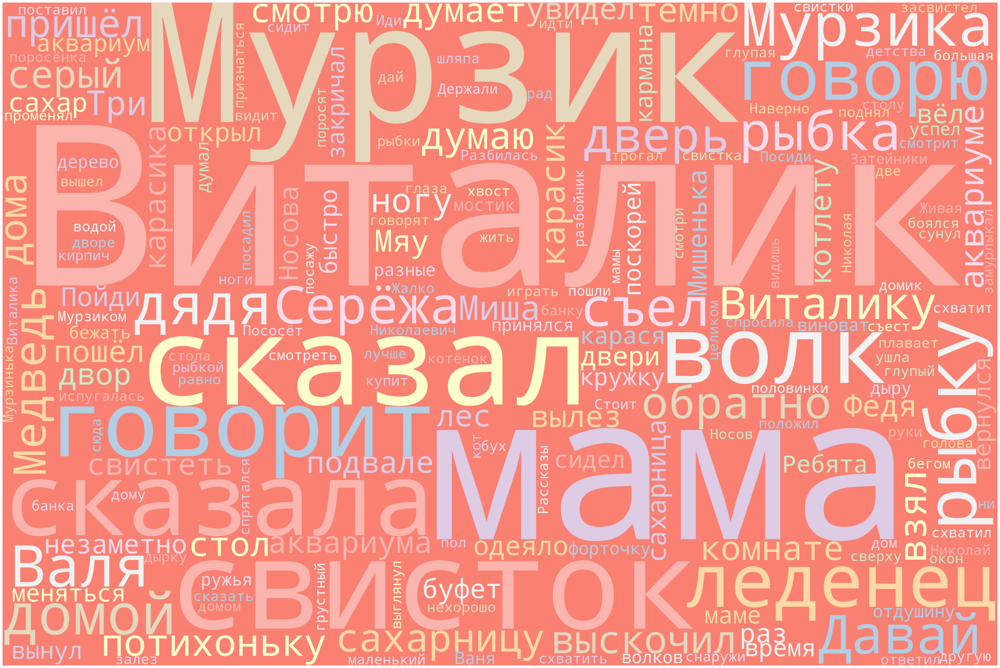

In [19]:
filtered_text = re.sub(r'==.*?==+', '', filtered_text) 
filtered_text = filtered_text.replace('\n', '') 
def plot_cloud(wordcloud): 
    plt.figure(figsize=(50, 40)) 
    plt.imshow(wordcloud)  
    plt.axis("off") 
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(filtered_text) 
plot_cloud(wordcloud)

## Незнайка на луне 

In [20]:
with open("Носов Николай. Незнайка на Луне (иллюстрации Генриха Валька) - royallib.com.txt") as file:
    text = file.read()
wordpunct = nltk.tokenize.WordPunctTokenizer()
print(wordpunct.tokenize(text))

['Николай', 'Носов', 'НЕЗНАЙКА', 'НА', 'ЛУНЕ', 'РОМАН', '-', 'СКАЗКА', 'Иллюстрации', 'Генриха', 'Валька', 'ЧАСТЬ', 'I', 'Глава', 'первая', 'КАК', 'ЗНАЙКА', 'ПОБЕДИЛ', 'ПРОФЕССОРА', 'ЗВЁЗДОЧКИНА', 'С', 'тех', 'пор', 'как', 'Незнайка', 'совершил', 'путешествие', 'в', 'Солнечный', 'город', ',', 'прошло', 'два', 'с', 'половиной', 'года', '.', 'Хотя', 'для', 'нас', 'с', 'вами', 'это', 'не', 'так', 'уж', 'много', ',', 'но', 'для', 'маленьких', 'коротышек', 'два', 'с', 'половиной', 'года', '—', 'срок', 'очень', 'большой', '.', 'Наслушавшись', 'рассказов', 'Незнайки', ',', 'Кнопочки', 'и', 'Пачкули', 'Пёстренького', ',', 'многие', 'коротышки', 'тоже', 'совершили', 'поездку', 'в', 'Солнечный', 'город', ',', 'а', 'когда', 'возвратились', ',', 'решили', 'и', 'у', 'себя', 'сделать', 'кое', '-', 'какие', 'усовершенствования', '.', 'Цветочный', 'город', 'изменился', 'с', 'тех', 'пор', 'так', ',', 'что', 'теперь', 'его', 'и', 'не', 'узнать', '.', 'В', 'нём', 'появилось', 'много', 'новых', ',', 'боль

In [21]:
with open("Носов Николай. Незнайка на Луне (иллюстрации Генриха Валька) - royallib.com.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized

['Николай',
 'Носов',
 'НЕЗНАЙКА',
 'НА',
 'ЛУНЕ',
 'РОМАН-СКАЗКА',
 'Иллюстрации',
 'Генриха',
 'Валька',
 'ЧАСТЬ',
 'I',
 'Глава',
 'первая',
 'КАК',
 'ЗНАЙКА',
 'ПОБЕДИЛ',
 'ПРОФЕССОРА',
 'ЗВЁЗДОЧКИНА',
 'С',
 'тех',
 'пор',
 'как',
 'Незнайка',
 'совершил',
 'путешествие',
 'в',
 'Солнечный',
 'город',
 ',',
 'прошло',
 'два',
 'с',
 'половиной',
 'года',
 '.',
 'Хотя',
 'для',
 'нас',
 'с',
 'вами',
 'это',
 'не',
 'так',
 'уж',
 'много',
 ',',
 'но',
 'для',
 'маленьких',
 'коротышек',
 'два',
 'с',
 'половиной',
 'года',
 '—',
 'срок',
 'очень',
 'большой',
 '.',
 'Наслушавшись',
 'рассказов',
 'Незнайки',
 ',',
 'Кнопочки',
 'и',
 'Пачкули',
 'Пёстренького',
 ',',
 'многие',
 'коротышки',
 'тоже',
 'совершили',
 'поездку',
 'в',
 'Солнечный',
 'город',
 ',',
 'а',
 'когда',
 'возвратились',
 ',',
 'решили',
 'и',
 'у',
 'себя',
 'сделать',
 'кое-какие',
 'усовершенствования',
 '.',
 'Цветочный',
 'город',
 'изменился',
 'с',
 'тех',
 'пор',
 'так',
 ',',
 'что',
 'теперь',
 'ег

In [22]:
tagged = nltk.pos_tag(tokenized)
tagged

[('Николай', 'JJ'),
 ('Носов', 'NNP'),
 ('НЕЗНАЙКА', 'NNP'),
 ('НА', 'NNP'),
 ('ЛУНЕ', 'NNP'),
 ('РОМАН-СКАЗКА', 'JJ'),
 ('Иллюстрации', 'NNP'),
 ('Генриха', 'NNP'),
 ('Валька', 'NNP'),
 ('ЧАСТЬ', 'NNP'),
 ('I', 'PRP'),
 ('Глава', 'VBP'),
 ('первая', 'JJ'),
 ('КАК', 'NNP'),
 ('ЗНАЙКА', 'NNP'),
 ('ПОБЕДИЛ', 'NNP'),
 ('ПРОФЕССОРА', 'NNP'),
 ('ЗВЁЗДОЧКИНА', 'NNP'),
 ('С', 'NNP'),
 ('тех', 'NNP'),
 ('пор', 'NNP'),
 ('как', 'NNP'),
 ('Незнайка', 'NNP'),
 ('совершил', 'NNP'),
 ('путешествие', 'NNP'),
 ('в', 'NNP'),
 ('Солнечный', 'NNP'),
 ('город', 'NNP'),
 (',', ','),
 ('прошло', 'NNP'),
 ('два', 'NNP'),
 ('с', 'NNP'),
 ('половиной', 'NNP'),
 ('года', 'NNP'),
 ('.', '.'),
 ('Хотя', 'VB'),
 ('для', 'JJ'),
 ('нас', 'NNP'),
 ('с', 'NNP'),
 ('вами', 'NNP'),
 ('это', 'NNP'),
 ('не', 'NNP'),
 ('так', 'NNP'),
 ('уж', 'NNP'),
 ('много', 'NNP'),
 (',', ','),
 ('но', 'NNP'),
 ('для', 'NNP'),
 ('маленьких', 'NNP'),
 ('коротышек', 'NNP'),
 ('два', 'NNP'),
 ('с', 'NNP'),
 ('половиной', 'NNP'),
 ('года',

In [23]:
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()
lemmatized = [lemm.lemmatize(word) for word in tokenized]
lemmatized

['Николай',
 'Носов',
 'НЕЗНАЙКА',
 'НА',
 'ЛУНЕ',
 'РОМАН-СКАЗКА',
 'Иллюстрации',
 'Генриха',
 'Валька',
 'ЧАСТЬ',
 'I',
 'Глава',
 'первая',
 'КАК',
 'ЗНАЙКА',
 'ПОБЕДИЛ',
 'ПРОФЕССОРА',
 'ЗВЁЗДОЧКИНА',
 'С',
 'тех',
 'пор',
 'как',
 'Незнайка',
 'совершил',
 'путешествие',
 'в',
 'Солнечный',
 'город',
 ',',
 'прошло',
 'два',
 'с',
 'половиной',
 'года',
 '.',
 'Хотя',
 'для',
 'нас',
 'с',
 'вами',
 'это',
 'не',
 'так',
 'уж',
 'много',
 ',',
 'но',
 'для',
 'маленьких',
 'коротышек',
 'два',
 'с',
 'половиной',
 'года',
 '—',
 'срок',
 'очень',
 'большой',
 '.',
 'Наслушавшись',
 'рассказов',
 'Незнайки',
 ',',
 'Кнопочки',
 'и',
 'Пачкули',
 'Пёстренького',
 ',',
 'многие',
 'коротышки',
 'тоже',
 'совершили',
 'поездку',
 'в',
 'Солнечный',
 'город',
 ',',
 'а',
 'когда',
 'возвратились',
 ',',
 'решили',
 'и',
 'у',
 'себя',
 'сделать',
 'кое-какие',
 'усовершенствования',
 '.',
 'Цветочный',
 'город',
 'изменился',
 'с',
 'тех',
 'пор',
 'так',
 ',',
 'что',
 'теперь',
 'ег

In [24]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('C'):
        return nltk.corpus.wordnet.CD
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Николай', 'JJ'),
 ('Носов', 'NNP'),
 ('НЕЗНАЙКА', 'NNP'),
 ('НА', 'NNP'),
 ('ЛУНЕ', 'NNP'),
 ('РОМАН-СКАЗКА', 'JJ'),
 ('Иллюстрации', 'NNP'),
 ('Генриха', 'NNP'),
 ('Валька', 'NNP'),
 ('ЧАСТЬ', 'NNP'),
 ('I', 'PRP'),
 ('Глава', 'VBP'),
 ('первая', 'JJ'),
 ('КАК', 'NNP'),
 ('ЗНАЙКА', 'NNP'),
 ('ПОБЕДИЛ', 'NNP'),
 ('ПРОФЕССОРА', 'NNP'),
 ('ЗВЁЗДОЧКИНА', 'NNP'),
 ('С', 'NNP'),
 ('тех', 'NNP'),
 ('пор', 'NNP'),
 ('как', 'NNP'),
 ('Незнайка', 'NNP'),
 ('совершил', 'NNP'),
 ('путешествие', 'NNP'),
 ('в', 'NNP'),
 ('Солнечный', 'NNP'),
 ('город', 'NNP'),
 (',', ','),
 ('прошло', 'NNP'),
 ('два', 'NNP'),
 ('с', 'NNP'),
 ('половиной', 'NNP'),
 ('года', 'NNP'),
 ('.', '.'),
 ('Хотя', 'VB'),
 ('для', 'JJ'),
 ('нас', 'NNP'),
 ('с', 'NNP'),
 ('вами', 'NNP'),
 ('это', 'NNP'),
 ('не', 'NNP'),
 ('так', 'NNP'),
 ('уж', 'NNP'),
 ('много', 'NNP'),
 (',', ','),
 ('но', 'NNP'),
 ('для', 'NNP'),
 ('маленьких', 'NNP'),
 ('коротышек', 'NNP'),
 ('два', 'NNP'),
 ('с', 'NNP'),
 ('половиной', 'NNP'),
 ('года',

In [25]:
stemmer = SnowballStemmer(language='russian')
with open("Носов Николай. Незнайка на Луне (иллюстрации Генриха Валька) - royallib.com.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
stemmed = [stemmer.stem(word) for word in tokenized]
stemmed

['никола',
 'нос',
 'незнайк',
 'на',
 'лун',
 'роман-сказк',
 'иллюстрац',
 'генрих',
 'вальк',
 'част',
 'I',
 'глав',
 'перв',
 'как',
 'знайк',
 'побед',
 'профессор',
 'звездочкин',
 'с',
 'тех',
 'пор',
 'как',
 'незнайк',
 'соверш',
 'путешеств',
 'в',
 'солнечн',
 'город',
 ',',
 'прошл',
 'два',
 'с',
 'половин',
 'год',
 '.',
 'хот',
 'для',
 'нас',
 'с',
 'вам',
 'эт',
 'не',
 'так',
 'уж',
 'мног',
 ',',
 'но',
 'для',
 'маленьк',
 'коротышек',
 'два',
 'с',
 'половин',
 'год',
 '—',
 'срок',
 'очен',
 'больш',
 '.',
 'наслуша',
 'рассказ',
 'незнайк',
 ',',
 'кнопочк',
 'и',
 'пачкул',
 'пестреньк',
 ',',
 'мног',
 'коротышк',
 'тож',
 'соверш',
 'поездк',
 'в',
 'солнечн',
 'город',
 ',',
 'а',
 'когд',
 'возврат',
 ',',
 'реш',
 'и',
 'у',
 'себ',
 'сдела',
 'кое-как',
 'усовершенствован',
 '.',
 'цветочн',
 'город',
 'измен',
 'с',
 'тех',
 'пор',
 'так',
 ',',
 'что',
 'тепер',
 'ег',
 'и',
 'не',
 'узна',
 '.',
 'в',
 'нем',
 'появ',
 'мног',
 'нов',
 ',',
 'больш',
 

In [26]:
SnowballStemmer(language="russian")
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("Носов Николай. Незнайка на Луне (иллюстрации Генриха Валька) - royallib.com.txt") as file:
    text = file.read()
    
type(text)

str

In [27]:
m=Mystem()
m.analyze('Знайка, однако ж, не был согласен ни с вулканической, ни с метеоритной теорией. Ещё до путешествия на Луну он создал свою собственную теорию происхождения лунных кратеров. Однажды он вместе со Стекляшкиным наблюдал Луну в телескоп, и ему бросилось в глаза, что лунная поверхность очень похожа на поверхность хорошо пропечённого блина с его ноздреватыми дырками. После этого Знайка часто ходил на кухню и наблюдал, как пекутся блины. Он заметил, что пока блин жидкий, его поверхность совершенно гладкая, но по мере того как он подогревается на сковородке, на его поверхности начинают появляться пузырьки нагретого пара. Проступив на поверхность блина, пузырьки лопаются, в результате чего на блине образуются неглубокие дырки, которые так и остаются, когда тесто как следует пропечётся и потеряет вязкость.Знайка даже сочинил книжку, в которой писал, что поверхность Луны не всегда была твёрдая и холодная, как теперь. Когда-то давно Луна представляла собой огненно-жидкий, то есть раскалённый до расплавленного состояния, шар. Постепенно, однако, поверхность Луны остывала и становилась уже не жидкая, а вязкая, словно тесто. Изнутри она была все ж таки ещё очень горячая, поэтому раскалённые газы вырывались на поверхность в виде громаднейших пузырей. Выйдя на поверхность Луны, пузыри эти, конечно, лопались. Но пока поверхность Луны была ещё достаточно жидкая, следы от лопнувших пузырей затягивались и исчезали, не оставляя следа, как не оставляют следа пузыри на воде во время дождя. Но когда поверхность Луны остыла настолько, что стала густая как тесто или как расплавленное стекло, следы от лопнувших пузырей уже не пропадали, а оставались в виде торчащих над поверхностью колец. Охлаждаясь все больше, кольца эти окончательно отвердевали. Сначала они были ровные, словно застывшие круги на воде, а потом постепенно разрушались и в конце концов стали похожи на те лунные кольцевые горы, или кратеры, которые каждый может наблюдать в телескоп.')

[{'analysis': [{'lex': 'знайка', 'wt': 1, 'gr': 'S,мж,од=им,ед'}],
  'text': 'Знайка'},
 {'text': ', '},
 {'analysis': [{'lex': 'однако', 'wt': 0.9865460353, 'gr': 'CONJ='}],
  'text': 'однако'},
 {'text': ' '},
 {'analysis': [{'lex': 'ж', 'wt': 0.9757629587, 'gr': 'PART='}], 'text': 'ж'},
 {'text': ', '},
 {'analysis': [{'lex': 'не', 'wt': 1, 'gr': 'PART='}], 'text': 'не'},
 {'text': ' '},
 {'analysis': [{'lex': 'быть', 'wt': 1, 'gr': 'V,нп=прош,ед,изъяв,муж,несов'}],
  'text': 'был'},
 {'text': ' '},
 {'analysis': [{'lex': 'согласный', 'wt': 1, 'gr': 'A=ед,кр,муж'}],
  'text': 'согласен'},
 {'text': ' '},
 {'analysis': [{'lex': 'ни', 'wt': 0.5596380099, 'gr': 'PART='}],
  'text': 'ни'},
 {'text': ' '},
 {'analysis': [{'lex': 'с', 'wt': 0.999977831, 'gr': 'PR='}], 'text': 'с'},
 {'text': ' '},
 {'analysis': [{'lex': 'вулканический',
    'wt': 1,
    'gr': 'A=(пр,ед,полн,жен|дат,ед,полн,жен|род,ед,полн,жен|твор,ед,полн,жен)'}],
  'text': 'вулканической'},
 {'text': ', '},
 {'analysis':

In [28]:
m=Mystem()
m.analyze('Если бы кто-нибудь из обитателей Космического городка в эту минуту проснулся и выглянул в окно, то был бы до крайности удивлён, увидев, как ракета медленно отделилась от земли и плавно поднялась в воздух. Это произошло почти бесшумно. Из нижнего сопла двигателя с лёгким шипением вырывалась тонкая струя нагретых газов. Реактивной силы от этой струи было достаточно, чтобы сообщить ракете поступательное движение, так как благодаря наличию прибора невесомости сама ракета ровным счётом ничего не весила.Как только ракета поднялась на достаточную высоту, электронная управляющая машина включила механизм поворота, благодаря чему головная часть ракеты начала описывать круговые движения, с каждым кругом наклоняясь все больше и больше. Но вот ракета приобрела такой угол наклона, что в поле зрения оптического прибора, оборудованного фотоэлементом, попала Луна. Свет от Луны был преобразован фотоэлементом в электрический сигнал. Получив этот сигнал, электронная управляющая машина ввела в действие самонаводящееся устройство, в результате чего ракета, совершив несколько затухающих колебательных движений, стабилизировалась и полетела прямо к Луне. Благодаря самонаводящемуся устройству ракета, как принято говорить, оказалась нацеленной на Луну. Как только ракета в силу каких-нибудь причин отклонялась от заданного курса, самонаводящееся устройство возвращало ракету на этот курс.На первых порах Пончик даже не понял, какую страшную он совершил вещь. Почувствовав, что попал в состояние невесомости, он стал делать попытки выкарабкаться из кнопочной кабины, воображая, что в другом каком-нибудь месте состояния невесомости нет. После ряда усилий это ему удалось, и он вернулся обратно к лифту. На этот раз он как следует разобрался в кнопках, которые имелись в кабине лифта, и нажал именно ту, которая обеспечивала спуск кабины на самый нижний этаж, то есть в хвостовую часть ракеты. Выйдя из лифта, он очутился перед дверью в шлюзокамеру, через которую, как уже сказано, можно было выйти наружу. Рядом с дверью Пончик обнаружил на стене кнопку. Однако сколько ни нажимал он на эту кнопку, сколько ни колотил в дверь ногами, дверь и не думала открываться. Пончик не знал, что дверь шлюзокамеры могла открыться лишь в том случае, если бы он надел на себя космический скафандр. И, надо сказать, хорошо, что Пончик этого не знал. Если бы он нажал кнопку, предварительно надев на себя скафандр, дверь отворилась бы и Пончик, покинув ракету, вывалился бы прямо в космическое пространство. Конечно, в этом случае он уже никогда бы не смог вернуться домой, так как остался бы на веки вечные летать в космосе на манер планеты.')

[{'analysis': [{'lex': 'если', 'wt': 1, 'gr': 'CONJ='}], 'text': 'Если'},
 {'text': ' '},
 {'analysis': [{'lex': 'бы', 'wt': 1, 'gr': 'PART='}], 'text': 'бы'},
 {'text': ' '},
 {'analysis': [{'lex': 'кто-нибудь', 'wt': 1, 'gr': 'SPRO,ед,муж,од=им'}],
  'text': 'кто-нибудь'},
 {'text': ' '},
 {'analysis': [{'lex': 'из', 'wt': 0.9999999775, 'gr': 'PR='}], 'text': 'из'},
 {'text': ' '},
 {'analysis': [{'lex': 'обитатель',
    'wt': 1,
    'gr': 'S,муж,од=(вин,мн|род,мн)'}],
  'text': 'обитателей'},
 {'text': ' '},
 {'analysis': [{'lex': 'космический',
    'wt': 1,
    'gr': 'A=(вин,ед,полн,муж,од|род,ед,полн,муж|род,ед,полн,сред)'}],
  'text': 'Космического'},
 {'text': ' '},
 {'analysis': [{'lex': 'городок', 'wt': 1, 'gr': 'S,муж,неод=род,ед'}],
  'text': 'городка'},
 {'text': ' '},
 {'analysis': [{'lex': 'в', 'wt': 0.9999917878, 'gr': 'PR='}], 'text': 'в'},
 {'text': ' '},
 {'analysis': [{'lex': 'этот', 'wt': 0.9999023162, 'gr': 'APRO=вин,ед,жен'}],
  'text': 'эту'},
 {'text': ' '},
 {'

In [29]:
import string

class Tokenizer:
    @staticmethod
    def tokenizer(text):
        translator = str.maketrans('', '', string.punctuation)
        text = text.translate(translator)
        tokens = text.split()

        return tokens
import spacy
nlp = spacy.load('ru_core_news_sm')

def remove_stopwords(text):
    nlp = spacy.load('ru_core_news_sm')
    doc = nlp(text)
    words = [token.text for token in doc if not token.is_stop and token.pos_ not in {'ADP', 'PRON', 'PART'}]
    filtered_text = ' '.join(words)

    return filtered_text


with open("Носов Николай. Незнайка на Луне (иллюстрации Генриха Валька) - royallib.com.txt") as file:
    text = file.read()
filtered_text = remove_stopwords(text)
print(filtered_text)


 Николай Носов 

 НЕЗНАЙКА ЛУНЕ 

 РОМАН - СКАЗКА 




 Иллюстрации Генриха Валька 





 ЧАСТЬ I 



 Глава первая 

 ЗНАЙКА ПОБЕДИЛ ПРОФЕССОРА ЗВЁЗДОЧКИНА 



 Незнайка совершил путешествие Солнечный город , прошло два половиной года . , маленьких коротышек два половиной года — срок большой . Наслушавшись рассказов Незнайки , Кнопочки Пачкули Пёстренького , коротышки совершили поездку Солнечный город , возвратились , решили сделать кое - усовершенствования . Цветочный город изменился , узнать . появилось новых , больших красивых домов . проекту архитектора Вертибутылкина улице Колокольчиков построено два вертящихся здания . пятиэтажное , башенного типа , спиральным спуском плавательным бассейном ( спустившись спиральному спуску , нырять прямо воду ) , шестиэтажное , качающимися балконами , парашютной вышкой чёртовым колесом крыше . улицах появилось множество автомобилей , спиралеходов , труболетов , авиагидромотоколясок , гусеничных вездеходов разных машин . 

 , . Жители Солнечного

In [30]:
with open("Носов Николай. Незнайка на Луне (иллюстрации Генриха Валька) - royallib.com.txt") as file:
    text = file.read()
tokenizer = Tokenizer()
tokens = tokenizer.tokenizer(text)
print(tokens)
m=Mystem()
m.analyze('Знайка, однако ж, не был согласен ни с вулканической, ни с метеоритной теорией. Ещё до путешествия на Луну он создал свою собственную теорию происхождения лунных кратеров. Однажды он вместе со Стекляшкиным наблюдал Луну в телескоп, и ему бросилось в глаза, что лунная поверхность очень похожа на поверхность хорошо пропечённого блина с его ноздреватыми дырками. После этого Знайка часто ходил на кухню и наблюдал, как пекутся блины. Он заметил, что пока блин жидкий, его поверхность совершенно гладкая, но по мере того как он подогревается на сковородке, на его поверхности начинают появляться пузырьки нагретого пара. Проступив на поверхность блина, пузырьки лопаются, в результате чего на блине образуются неглубокие дырки, которые так и остаются, когда тесто как следует пропечётся и потеряет вязкость.Знайка даже сочинил книжку, в которой писал, что поверхность Луны не всегда была твёрдая и холодная, как теперь. Когда-то давно Луна представляла собой огненно-жидкий, то есть раскалённый до расплавленного состояния, шар. Постепенно, однако, поверхность Луны остывала и становилась уже не жидкая, а вязкая, словно тесто. Изнутри она была все ж таки ещё очень горячая, поэтому раскалённые газы вырывались на поверхность в виде громаднейших пузырей. Выйдя на поверхность Луны, пузыри эти, конечно, лопались. Но пока поверхность Луны была ещё достаточно жидкая, следы от лопнувших пузырей затягивались и исчезали, не оставляя следа, как не оставляют следа пузыри на воде во время дождя. Но когда поверхность Луны остыла настолько, что стала густая как тесто или как расплавленное стекло, следы от лопнувших пузырей уже не пропадали, а оставались в виде торчащих над поверхностью колец. Охлаждаясь все больше, кольца эти окончательно отвердевали. Сначала они были ровные, словно застывшие круги на воде, а потом постепенно разрушались и в конце концов стали похожи на те лунные кольцевые горы, или кратеры, которые каждый может наблюдать в телескоп.')

['Николай', 'Носов', 'НЕЗНАЙКА', 'НА', 'ЛУНЕ', 'РОМАНСКАЗКА', 'Иллюстрации', 'Генриха', 'Валька', 'ЧАСТЬ', 'I', 'Глава', 'первая', 'КАК', 'ЗНАЙКА', 'ПОБЕДИЛ', 'ПРОФЕССОРА', 'ЗВЁЗДОЧКИНА', 'С', 'тех', 'пор', 'как', 'Незнайка', 'совершил', 'путешествие', 'в', 'Солнечный', 'город', 'прошло', 'два', 'с', 'половиной', 'года', 'Хотя', 'для', 'нас', 'с', 'вами', 'это', 'не', 'так', 'уж', 'много', 'но', 'для', 'маленьких', 'коротышек', 'два', 'с', 'половиной', 'года', '—', 'срок', 'очень', 'большой', 'Наслушавшись', 'рассказов', 'Незнайки', 'Кнопочки', 'и', 'Пачкули', 'Пёстренького', 'многие', 'коротышки', 'тоже', 'совершили', 'поездку', 'в', 'Солнечный', 'город', 'а', 'когда', 'возвратились', 'решили', 'и', 'у', 'себя', 'сделать', 'коекакие', 'усовершенствования', 'Цветочный', 'город', 'изменился', 'с', 'тех', 'пор', 'так', 'что', 'теперь', 'его', 'и', 'не', 'узнать', 'В', 'нём', 'появилось', 'много', 'новых', 'больших', 'и', 'очень', 'красивых', 'домов', 'По', 'проекту', 'архитектора', 'Верт

[{'analysis': [{'lex': 'знайка', 'wt': 1, 'gr': 'S,мж,од=им,ед'}],
  'text': 'Знайка'},
 {'text': ', '},
 {'analysis': [{'lex': 'однако', 'wt': 0.9865460353, 'gr': 'CONJ='}],
  'text': 'однако'},
 {'text': ' '},
 {'analysis': [{'lex': 'ж', 'wt': 0.9757629587, 'gr': 'PART='}], 'text': 'ж'},
 {'text': ', '},
 {'analysis': [{'lex': 'не', 'wt': 1, 'gr': 'PART='}], 'text': 'не'},
 {'text': ' '},
 {'analysis': [{'lex': 'быть', 'wt': 1, 'gr': 'V,нп=прош,ед,изъяв,муж,несов'}],
  'text': 'был'},
 {'text': ' '},
 {'analysis': [{'lex': 'согласный', 'wt': 1, 'gr': 'A=ед,кр,муж'}],
  'text': 'согласен'},
 {'text': ' '},
 {'analysis': [{'lex': 'ни', 'wt': 0.5596380099, 'gr': 'PART='}],
  'text': 'ни'},
 {'text': ' '},
 {'analysis': [{'lex': 'с', 'wt': 0.999977831, 'gr': 'PR='}], 'text': 'с'},
 {'text': ' '},
 {'analysis': [{'lex': 'вулканический',
    'wt': 1,
    'gr': 'A=(пр,ед,полн,жен|дат,ед,полн,жен|род,ед,полн,жен|твор,ед,полн,жен)'}],
  'text': 'вулканической'},
 {'text': ', '},
 {'analysis':

In [31]:
import re 
import matplotlib.pyplot as plt 
from wordcloud import WordCloud, STOPWORDS 

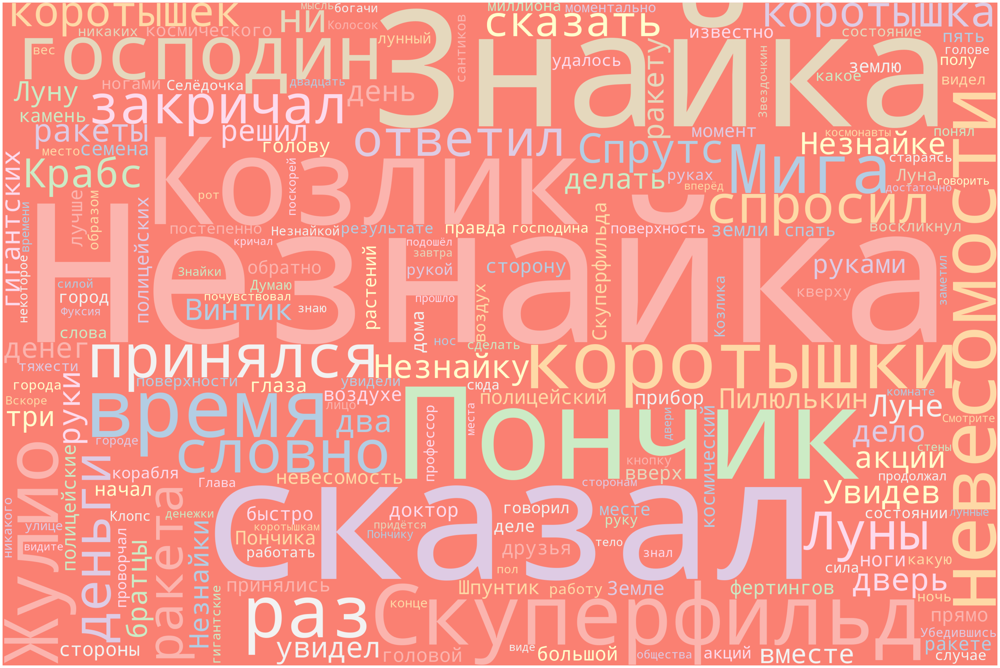

In [32]:
filtered_text = re.sub(r'==.*?==+', '', filtered_text) 
filtered_text = filtered_text.replace('\n', '') 
def plot_cloud(wordcloud): 
    plt.figure(figsize=(50, 40)) 
    plt.imshow(wordcloud)  
    plt.axis("off") 
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(filtered_text) 
plot_cloud(wordcloud)

## Веселая семейка

In [33]:
with open("64466206.txt") as file:
    text = file.read()
wordpunct = nltk.tokenize.WordPunctTokenizer()
print(wordpunct.tokenize(text))

['Веселая', 'семейка', 'Николай', 'Николаевич', 'Носов', 'Носов', 'нашего', 'детства', '«', 'Весёлая', 'семейка', '»', '–', 'увлекательная', 'повесть', 'известного', 'детского', 'писателя', 'Николая', 'Николаевича', 'Носова', 'о', 'двух', 'приятелях', ',', 'выдумщиках', 'и', 'фантазёрах', ',', 'которые', 'не', 'привыкли', 'скучать', 'и', 'сидеть', 'без', 'дела', '.', 'И', 'вот', 'как', '-', 'то', 'раз', 'ребятам', 'в', 'руки', 'попала', 'книжка', 'о', 'разведении', 'цыплят', '.', 'Мальчишки', 'недолго', 'думая', 'приступили', 'к', 'делу', '…', 'Николай', 'Николаевич', 'Носов', 'Весёлая', 'семейка', '©', 'Носов', '.', 'Текст', ',', 'художественные', 'образы', ',', 'иллюстрации', ',', '2017', '©', 'Оформление', '.', 'ООО', '«', 'Издательская', 'Группа', '«', 'Азбука', '-', 'Аттикус', '»,', '2017', 'Machaon', '®', 'Важное', 'решение', 'Это', 'случилось', 'после', 'того', ',', 'как', 'взорвалась', 'паровая', 'машина', ',', 'которую', 'мы', 'с', 'Мишкой', 'делали', 'из', 'консервной', 'банк

In [34]:
with open("64466206.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
tokenized

['Веселая',
 'семейка',
 'Николай',
 'Николаевич',
 'Носов',
 'Носов',
 'нашего',
 'детства',
 '«',
 'Весёлая',
 'семейка',
 '»',
 '–',
 'увлекательная',
 'повесть',
 'известного',
 'детского',
 'писателя',
 'Николая',
 'Николаевича',
 'Носова',
 'о',
 'двух',
 'приятелях',
 ',',
 'выдумщиках',
 'и',
 'фантазёрах',
 ',',
 'которые',
 'не',
 'привыкли',
 'скучать',
 'и',
 'сидеть',
 'без',
 'дела',
 '.',
 'И',
 'вот',
 'как-то',
 'раз',
 'ребятам',
 'в',
 'руки',
 'попала',
 'книжка',
 'о',
 'разведении',
 'цыплят',
 '.',
 'Мальчишки',
 'недолго',
 'думая',
 'приступили',
 'к',
 'делу…',
 'Николай',
 'Николаевич',
 'Носов',
 'Весёлая',
 'семейка',
 '©',
 'Носов',
 '.',
 'Текст',
 ',',
 'художественные',
 'образы',
 ',',
 'иллюстрации',
 ',',
 '2017',
 '©',
 'Оформление',
 '.',
 'ООО',
 '«',
 'Издательская',
 'Группа',
 '«',
 'Азбука-Аттикус',
 '»',
 ',',
 '2017',
 'Machaon®',
 'Важное',
 'решение',
 'Это',
 'случилось',
 'после',
 'того',
 ',',
 'как',
 'взорвалась',
 'паровая',
 'машин

In [35]:
tagged = nltk.pos_tag(tokenized)
tagged

[('Веселая', 'JJ'),
 ('семейка', 'NNP'),
 ('Николай', 'NNP'),
 ('Николаевич', 'NNP'),
 ('Носов', 'NNP'),
 ('Носов', 'NNP'),
 ('нашего', 'NNP'),
 ('детства', 'NNP'),
 ('«', 'NNP'),
 ('Весёлая', 'NNP'),
 ('семейка', 'NNP'),
 ('»', 'NNP'),
 ('–', 'NNP'),
 ('увлекательная', 'NNP'),
 ('повесть', 'NNP'),
 ('известного', 'NNP'),
 ('детского', 'NNP'),
 ('писателя', 'NNP'),
 ('Николая', 'NNP'),
 ('Николаевича', 'NNP'),
 ('Носова', 'NNP'),
 ('о', 'NNP'),
 ('двух', 'NNP'),
 ('приятелях', 'NNP'),
 (',', ','),
 ('выдумщиках', 'NNP'),
 ('и', 'NNP'),
 ('фантазёрах', 'NNP'),
 (',', ','),
 ('которые', 'NNP'),
 ('не', 'NNP'),
 ('привыкли', 'NNP'),
 ('скучать', 'NNP'),
 ('и', 'NNP'),
 ('сидеть', 'NNP'),
 ('без', 'NNP'),
 ('дела', 'NNP'),
 ('.', '.'),
 ('И', 'VB'),
 ('вот', 'JJ'),
 ('как-то', 'JJ'),
 ('раз', 'NN'),
 ('ребятам', 'NNP'),
 ('в', 'NNP'),
 ('руки', 'NNP'),
 ('попала', 'NNP'),
 ('книжка', 'NNP'),
 ('о', 'NNP'),
 ('разведении', 'NNP'),
 ('цыплят', 'NNP'),
 ('.', '.'),
 ('Мальчишки', 'VB'),
 ('не

In [36]:
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()
lemmatized = [lemm.lemmatize(word) for word in tokenized]
lemmatized

['Веселая',
 'семейка',
 'Николай',
 'Николаевич',
 'Носов',
 'Носов',
 'нашего',
 'детства',
 '«',
 'Весёлая',
 'семейка',
 '»',
 '–',
 'увлекательная',
 'повесть',
 'известного',
 'детского',
 'писателя',
 'Николая',
 'Николаевича',
 'Носова',
 'о',
 'двух',
 'приятелях',
 ',',
 'выдумщиках',
 'и',
 'фантазёрах',
 ',',
 'которые',
 'не',
 'привыкли',
 'скучать',
 'и',
 'сидеть',
 'без',
 'дела',
 '.',
 'И',
 'вот',
 'как-то',
 'раз',
 'ребятам',
 'в',
 'руки',
 'попала',
 'книжка',
 'о',
 'разведении',
 'цыплят',
 '.',
 'Мальчишки',
 'недолго',
 'думая',
 'приступили',
 'к',
 'делу…',
 'Николай',
 'Николаевич',
 'Носов',
 'Весёлая',
 'семейка',
 '©',
 'Носов',
 '.',
 'Текст',
 ',',
 'художественные',
 'образы',
 ',',
 'иллюстрации',
 ',',
 '2017',
 '©',
 'Оформление',
 '.',
 'ООО',
 '«',
 'Издательская',
 'Группа',
 '«',
 'Азбука-Аттикус',
 '»',
 ',',
 '2017',
 'Machaon®',
 'Важное',
 'решение',
 'Это',
 'случилось',
 'после',
 'того',
 ',',
 'как',
 'взорвалась',
 'паровая',
 'машин

In [37]:
from nltk.stem import WordNetLemmatizer
lemm = WordNetLemmatizer()
lemmatized = [lemm.lemmatize(word) for word in tokenized]
lemmatized

['Веселая',
 'семейка',
 'Николай',
 'Николаевич',
 'Носов',
 'Носов',
 'нашего',
 'детства',
 '«',
 'Весёлая',
 'семейка',
 '»',
 '–',
 'увлекательная',
 'повесть',
 'известного',
 'детского',
 'писателя',
 'Николая',
 'Николаевича',
 'Носова',
 'о',
 'двух',
 'приятелях',
 ',',
 'выдумщиках',
 'и',
 'фантазёрах',
 ',',
 'которые',
 'не',
 'привыкли',
 'скучать',
 'и',
 'сидеть',
 'без',
 'дела',
 '.',
 'И',
 'вот',
 'как-то',
 'раз',
 'ребятам',
 'в',
 'руки',
 'попала',
 'книжка',
 'о',
 'разведении',
 'цыплят',
 '.',
 'Мальчишки',
 'недолго',
 'думая',
 'приступили',
 'к',
 'делу…',
 'Николай',
 'Николаевич',
 'Носов',
 'Весёлая',
 'семейка',
 '©',
 'Носов',
 '.',
 'Текст',
 ',',
 'художественные',
 'образы',
 ',',
 'иллюстрации',
 ',',
 '2017',
 '©',
 'Оформление',
 '.',
 'ООО',
 '«',
 'Издательская',
 'Группа',
 '«',
 'Азбука-Аттикус',
 '»',
 ',',
 '2017',
 'Machaon®',
 'Важное',
 'решение',
 'Это',
 'случилось',
 'после',
 'того',
 ',',
 'как',
 'взорвалась',
 'паровая',
 'машин

In [38]:
def pos_tagger(nltk_tag):
    if nltk_tag.startswith('N'):
        return nltk.corpus.wordnet.NOUN
    elif nltk_tag.startswith('J'):
        return nltk.corpus.wordnet.ADJ
    elif nltk_tag.startswith('C'):
        return nltk.corpus.wordnet.CD
    elif nltk_tag.startswith('V'):
        return nltk.corpus.wordnet.VERB
    elif nltk_tag.startswith('R'):
        return nltk.corpus.wordnet.ADV
    else:          
        return None

tagged

[('Веселая', 'JJ'),
 ('семейка', 'NNP'),
 ('Николай', 'NNP'),
 ('Николаевич', 'NNP'),
 ('Носов', 'NNP'),
 ('Носов', 'NNP'),
 ('нашего', 'NNP'),
 ('детства', 'NNP'),
 ('«', 'NNP'),
 ('Весёлая', 'NNP'),
 ('семейка', 'NNP'),
 ('»', 'NNP'),
 ('–', 'NNP'),
 ('увлекательная', 'NNP'),
 ('повесть', 'NNP'),
 ('известного', 'NNP'),
 ('детского', 'NNP'),
 ('писателя', 'NNP'),
 ('Николая', 'NNP'),
 ('Николаевича', 'NNP'),
 ('Носова', 'NNP'),
 ('о', 'NNP'),
 ('двух', 'NNP'),
 ('приятелях', 'NNP'),
 (',', ','),
 ('выдумщиках', 'NNP'),
 ('и', 'NNP'),
 ('фантазёрах', 'NNP'),
 (',', ','),
 ('которые', 'NNP'),
 ('не', 'NNP'),
 ('привыкли', 'NNP'),
 ('скучать', 'NNP'),
 ('и', 'NNP'),
 ('сидеть', 'NNP'),
 ('без', 'NNP'),
 ('дела', 'NNP'),
 ('.', '.'),
 ('И', 'VB'),
 ('вот', 'JJ'),
 ('как-то', 'JJ'),
 ('раз', 'NN'),
 ('ребятам', 'NNP'),
 ('в', 'NNP'),
 ('руки', 'NNP'),
 ('попала', 'NNP'),
 ('книжка', 'NNP'),
 ('о', 'NNP'),
 ('разведении', 'NNP'),
 ('цыплят', 'NNP'),
 ('.', '.'),
 ('Мальчишки', 'VB'),
 ('не

In [39]:
stemmer = SnowballStemmer(language='russian')
with open("64466206.txt") as file:
    text = file.read()
tokenized = nltk.word_tokenize(text)
stemmed = [stemmer.stem(word) for word in tokenized]
stemmed

['весел',
 'семейк',
 'никола',
 'николаевич',
 'нос',
 'нос',
 'наш',
 'детств',
 '«',
 'весел',
 'семейк',
 '»',
 '–',
 'увлекательн',
 'повест',
 'известн',
 'детск',
 'писател',
 'никол',
 'николаевич',
 'носов',
 'о',
 'двух',
 'приятел',
 ',',
 'выдумщик',
 'и',
 'фантазер',
 ',',
 'котор',
 'не',
 'привыкл',
 'скуча',
 'и',
 'сидет',
 'без',
 'дел',
 '.',
 'и',
 'вот',
 'как-т',
 'раз',
 'ребят',
 'в',
 'рук',
 'попа',
 'книжк',
 'о',
 'разведен',
 'цыпл',
 '.',
 'мальчишк',
 'недолг',
 'дум',
 'приступ',
 'к',
 'делу…',
 'никола',
 'николаевич',
 'нос',
 'весел',
 'семейк',
 '©',
 'нос',
 '.',
 'текст',
 ',',
 'художествен',
 'образ',
 ',',
 'иллюстрац',
 ',',
 '2017',
 '©',
 'оформлен',
 '.',
 'оо',
 '«',
 'издательск',
 'групп',
 '«',
 'азбука-аттикус',
 '»',
 ',',
 '2017',
 'Machaon®',
 'важн',
 'решен',
 'эт',
 'случ',
 'посл',
 'тог',
 ',',
 'как',
 'взорва',
 'паров',
 'машин',
 ',',
 'котор',
 'мы',
 'с',
 'мишк',
 'дела',
 'из',
 'консервн',
 'банк',
 '.',
 'мишк',
 'сл

In [40]:
SnowballStemmer(language="russian")
import pymorphy2
morph = pymorphy2.MorphAnalyzer()
with open("64466206.txt") as file:
    text = file.read()
    
type(text)

str

In [41]:
m=Mystem()
m.analyze('В эту ночь я долго не мог заснуть.Целый час я лежал в постели и думал об инкубаторе. Сначала я хотел попросить мою маму, чтоб она разрешила нам жечь керосиновую лампу, но потом понял, что и моя мама не позволит нам возиться с огнём, так как она очень боится пожара и всегда прячет от меня спички. К тому же Мишкина мама отняла у нас керосиновую лампу и ни за что не отдала бы обратно. Все давно уже спали, а я думал об этом и никак не мог заснуть.Вдруг в мою голову пришла очень хорошая мысль: «А что, если нагревать воду на электрической лампочке?»Я потихоньку встал, зажёг настольную лампу и приложил к ней палец, чтобы узнать, много ли от электрической лампочки получается тепла. Лампочка быстро нагрелась, так что палец невозможно стало держать. Тогда я снял со стены градусник и прислонил к лампочке.Ртуть быстро поднялась и упёрлась в верхний конец, так что на градуснике не хватило даже делений. Значит, тепла получалось много.Я успокоился и повесил градусник на место. Впоследствии, через некоторое время, мы обнаружили, что этот градусник стал врать и показывать неправильную температуру. Когда в комнате было прохладно, он почему-то показывал градусов сорок жары, а когда становилось теплей, ртуть забиралась на самый верх и торчала там до тех пор, пока её не стряхивали. Меньше тридцати градусов жары он никогда не показывал, так что мы даже зимой могли бы прожить без отопления, если бы он не врал.Может быть, это случилось оттого, что я прикладывал градусник к лампе? Не знаю.На другой день я рассказал о своей выдумке Мишке.Когда мы вернулись из школы, я выпросил у мамы старую настольную лампу, которая стояла у нас в шкафу, и мы решили попробовать нагревать воду электричеством. Мы поставили настольную лампу вместо керосиновой в ящик, а чтобы лампочка была поближе к банке с водой и лучше нагревала её, Мишка подложил под неё несколько книжек. Я включил электричество, и мы стали следить за градусником. Сначала ртуть в градуснике долго стояла на месте, и мы даже стали бояться, что у нас ничего не выйдет. Потом электрическая лампочка постепенно нагрела воду, и ртуть начала медленно подниматься кверху.Через полчаса она поднялась до тридцати девяти градусов. Мишка от радости захлопал в ладоши и закричал:Ура! Вот она, настоящая куриная температура!.. Оказывается, электричество не хуже керосина.')

[{'analysis': [{'lex': 'в', 'wt': 0.9999917878, 'gr': 'PR='}], 'text': 'В'},
 {'text': ' '},
 {'analysis': [{'lex': 'этот', 'wt': 0.9999023162, 'gr': 'APRO=вин,ед,жен'}],
  'text': 'эту'},
 {'text': ' '},
 {'analysis': [{'lex': 'ночь', 'wt': 1, 'gr': 'S,жен,неод=(вин,ед|им,ед)'}],
  'text': 'ночь'},
 {'text': ' '},
 {'analysis': [{'lex': 'я', 'wt': 0.9999716281, 'gr': 'SPRO,ед,1-л=им'}],
  'text': 'я'},
 {'text': ' '},
 {'analysis': [{'lex': 'долго', 'wt': 0.9956396745, 'gr': 'ADV='}],
  'text': 'долго'},
 {'text': ' '},
 {'analysis': [{'lex': 'не', 'wt': 1, 'gr': 'PART='}], 'text': 'не'},
 {'text': ' '},
 {'analysis': [{'lex': 'мочь', 'wt': 1, 'gr': 'V,несов,нп=прош,ед,изъяв,муж'}],
  'text': 'мог'},
 {'text': ' '},
 {'analysis': [{'lex': 'заснуть', 'wt': 1, 'gr': 'V,сов,нп=инф'}],
  'text': 'заснуть'},
 {'text': '.'},
 {'analysis': [{'lex': 'целый',
    'wt': 1,
    'gr': 'A=(вин,ед,полн,муж,неод|им,ед,полн,муж)'}],
  'text': 'Целый'},
 {'text': ' '},
 {'analysis': [{'lex': 'час', 'w

In [42]:
m=Mystem()
m.analyze('Это случилось после того, как взорвалась паровая машина, которую мы с Мишкой делали из консервной банки. Мишка слишком сильно нагрел воду, банка лопнула, и горячим паром ему обожгло руку. Хорошо, что Мишкина мама тут же намазала ему руку нафталановой мазью. Это очень хорошее средство. Кто не верит, пусть сам попробует. Только мазать нужно сейчас же, как обожжёшься, пока не сошла кожа.После того как машина лопнула, Мишкина мама запретила нам с ней возиться и выбросила её в мусорный ящик. Пришлось нам некоторое время слоняться без дела. Скука была смертельная. Началась весна. Снег таял повсюду. По улицам журчали ручьи. Солнышко уже по-весеннему светило в окна. Но ничто нас не радовало. Такой уж у нас с Мишкой характер – нам обязательно нужно какое-нибудь занятие. Когда нечего делать, мы начинаем скучать и скучаем до тех пор, пока не находим какого-нибудь дела.Один раз я прихожу к Мишке, а он сидит за столом, носом уткнулся в какую-то книгу, голову обхватил руками и ничего на свете, кроме этой книги, не видит и даже не замечает, что я пришёл. Я нарочно хлопнул погромче дверью, чтобы он обратил на меня внимание.– А, это ты, Николадзе! – обрадовался Мишка.')

[{'analysis': [{'lex': 'это',
    'wt': 0.7809833731,
    'gr': 'SPRO,ед,сред,неод=(вин|им)'}],
  'text': 'Это'},
 {'text': ' '},
 {'analysis': [{'lex': 'случаться',
    'wt': 1,
    'gr': 'V,нп=прош,ед,изъяв,сред,сов'}],
  'text': 'случилось'},
 {'text': ' '},
 {'analysis': [{'lex': 'после', 'wt': 0.9774551099, 'gr': 'PR='}],
  'text': 'после'},
 {'text': ' '},
 {'analysis': [{'lex': 'то',
    'wt': 0.7857450701,
    'gr': 'SPRO,ед,сред,неод=род'}],
  'text': 'того'},
 {'text': ', '},
 {'analysis': [{'lex': 'как', 'wt': 0.6102574114, 'gr': 'CONJ='}],
  'text': 'как'},
 {'text': ' '},
 {'analysis': [{'lex': 'взрываться',
    'wt': 1,
    'gr': 'V,нп=прош,ед,изъяв,жен,сов'}],
  'text': 'взорвалась'},
 {'text': ' '},
 {'analysis': [{'lex': 'паровой', 'wt': 1, 'gr': 'A=им,ед,полн,жен'}],
  'text': 'паровая'},
 {'text': ' '},
 {'analysis': [{'lex': 'машина', 'wt': 0.999173444, 'gr': 'S,жен,неод=им,ед'}],
  'text': 'машина'},
 {'text': ', '},
 {'analysis': [{'lex': 'который', 'wt': 1, 'gr':

In [45]:
import string

class Tokenizer:
    @staticmethod
    def tokenizer(text):
        translator = str.maketrans('', '', string.punctuation)
        text = text.translate(translator)
        tokens = text.split()

        return tokens
import spacy
nlp = spacy.load('ru_core_news_sm')

def remove_stopwords(text):
    nlp = spacy.load('ru_core_news_sm')
    doc = nlp(text)
    words = [token.text for token in doc if not token.is_stop and token.pos_ not in {'ADP', 'PRON', 'PART'}]
    filtered_text = ' '.join(words)

    return filtered_text


with open("64466206.txt") as file:
    text = file.read()
filtered_text = remove_stopwords(text)
print(filtered_text)

Веселая семейка 
 Николай Николаевич Носов 


 Носов детства 
 « Весёлая семейка »   – увлекательная повесть известного детского писателя Николая Николаевича Носова двух приятелях , выдумщиках фантазёрах , привыкли скучать сидеть дела . - раз ребятам руки попала книжка разведении цыплят . Мальчишки недолго думая приступили делу … 





 Николай Николаевич Носов 

 Весёлая семейка 



 © Носов . Текст , художественные образы , иллюстрации , 2017 

 © Оформление . ООО « Издательская Группа « Азбука - Аттикус » , 2017 

 Machaon ® 




 Важное решение 


 случилось , взорвалась паровая машина ,   Мишкой делали консервной банки . Мишка сильно нагрел воду , банка лопнула , горячим паром обожгло руку . , Мишкина мама намазала руку нафталановой мазью . хорошее средство . верит , попробует . мазать , обожжёшься , сошла кожа . 

 машина лопнула , Мишкина мама запретила возиться выбросила мусорный ящик . Пришлось некоторое время слоняться дела . Скука смертельная . Началась весна . Снег таял пов

In [46]:
with open("64466206.txt") as file:
    text = file.read()
tokenizer = Tokenizer()
tokens = tokenizer.tokenizer(text)
print(tokens)
m=Mystem()
m.analyze('В эту ночь я долго не мог заснуть.Целый час я лежал в постели и думал об инкубаторе. Сначала я хотел попросить мою маму, чтоб она разрешила нам жечь керосиновую лампу, но потом понял, что и моя мама не позволит нам возиться с огнём, так как она очень боится пожара и всегда прячет от меня спички. К тому же Мишкина мама отняла у нас керосиновую лампу и ни за что не отдала бы обратно. Все давно уже спали, а я думал об этом и никак не мог заснуть.Вдруг в мою голову пришла очень хорошая мысль: «А что, если нагревать воду на электрической лампочке?»Я потихоньку встал, зажёг настольную лампу и приложил к ней палец, чтобы узнать, много ли от электрической лампочки получается тепла. Лампочка быстро нагрелась, так что палец невозможно стало держать. Тогда я снял со стены градусник и прислонил к лампочке.Ртуть быстро поднялась и упёрлась в верхний конец, так что на градуснике не хватило даже делений. Значит, тепла получалось много.Я успокоился и повесил градусник на место. Впоследствии, через некоторое время, мы обнаружили, что этот градусник стал врать и показывать неправильную температуру. Когда в комнате было прохладно, он почему-то показывал градусов сорок жары, а когда становилось теплей, ртуть забиралась на самый верх и торчала там до тех пор, пока её не стряхивали. Меньше тридцати градусов жары он никогда не показывал, так что мы даже зимой могли бы прожить без отопления, если бы он не врал.Может быть, это случилось оттого, что я прикладывал градусник к лампе? Не знаю.На другой день я рассказал о своей выдумке Мишке.Когда мы вернулись из школы, я выпросил у мамы старую настольную лампу, которая стояла у нас в шкафу, и мы решили попробовать нагревать воду электричеством. Мы поставили настольную лампу вместо керосиновой в ящик, а чтобы лампочка была поближе к банке с водой и лучше нагревала её, Мишка подложил под неё несколько книжек. Я включил электричество, и мы стали следить за градусником. Сначала ртуть в градуснике долго стояла на месте, и мы даже стали бояться, что у нас ничего не выйдет. Потом электрическая лампочка постепенно нагрела воду, и ртуть начала медленно подниматься кверху.Через полчаса она поднялась до тридцати девяти градусов. Мишка от радости захлопал в ладоши и закричал:Ура! Вот она, настоящая куриная температура!.. Оказывается, электричество не хуже керосина.')

['Веселая', 'семейка', 'Николай', 'Николаевич', 'Носов', 'Носов', 'нашего', 'детства', '«Весёлая', 'семейка»', '–', 'увлекательная', 'повесть', 'известного', 'детского', 'писателя', 'Николая', 'Николаевича', 'Носова', 'о', 'двух', 'приятелях', 'выдумщиках', 'и', 'фантазёрах', 'которые', 'не', 'привыкли', 'скучать', 'и', 'сидеть', 'без', 'дела', 'И', 'вот', 'както', 'раз', 'ребятам', 'в', 'руки', 'попала', 'книжка', 'о', 'разведении', 'цыплят', 'Мальчишки', 'недолго', 'думая', 'приступили', 'к', 'делу…', 'Николай', 'Николаевич', 'Носов', 'Весёлая', 'семейка', '©', 'Носов', 'Текст', 'художественные', 'образы', 'иллюстрации', '2017', '©', 'Оформление', 'ООО', '«Издательская', 'Группа', '«АзбукаАттикус»', '2017', 'Machaon®', 'Важное', 'решение', 'Это', 'случилось', 'после', 'того', 'как', 'взорвалась', 'паровая', 'машина', 'которую', 'мы', 'с', 'Мишкой', 'делали', 'из', 'консервной', 'банки', 'Мишка', 'слишком', 'сильно', 'нагрел', 'воду', 'банка', 'лопнула', 'и', 'горячим', 'паром', 'ему'

[{'analysis': [{'lex': 'в', 'wt': 0.9999917878, 'gr': 'PR='}], 'text': 'В'},
 {'text': ' '},
 {'analysis': [{'lex': 'этот', 'wt': 0.9999023162, 'gr': 'APRO=вин,ед,жен'}],
  'text': 'эту'},
 {'text': ' '},
 {'analysis': [{'lex': 'ночь', 'wt': 1, 'gr': 'S,жен,неод=(вин,ед|им,ед)'}],
  'text': 'ночь'},
 {'text': ' '},
 {'analysis': [{'lex': 'я', 'wt': 0.9999716281, 'gr': 'SPRO,ед,1-л=им'}],
  'text': 'я'},
 {'text': ' '},
 {'analysis': [{'lex': 'долго', 'wt': 0.9956396745, 'gr': 'ADV='}],
  'text': 'долго'},
 {'text': ' '},
 {'analysis': [{'lex': 'не', 'wt': 1, 'gr': 'PART='}], 'text': 'не'},
 {'text': ' '},
 {'analysis': [{'lex': 'мочь', 'wt': 1, 'gr': 'V,несов,нп=прош,ед,изъяв,муж'}],
  'text': 'мог'},
 {'text': ' '},
 {'analysis': [{'lex': 'заснуть', 'wt': 1, 'gr': 'V,сов,нп=инф'}],
  'text': 'заснуть'},
 {'text': '.'},
 {'analysis': [{'lex': 'целый',
    'wt': 1,
    'gr': 'A=(вин,ед,полн,муж,неод|им,ед,полн,муж)'}],
  'text': 'Целый'},
 {'text': ' '},
 {'analysis': [{'lex': 'час', 'w

In [47]:
import re 
import matplotlib.pyplot as plt 
from wordcloud import WordCloud, STOPWORDS 

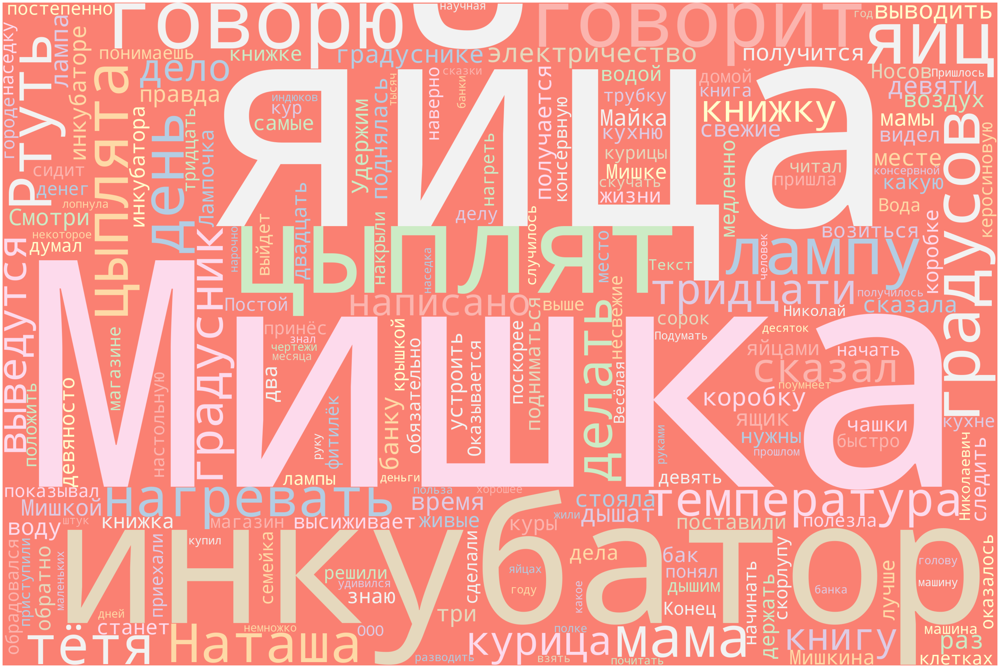

In [48]:
filtered_text = re.sub(r'==.*?==+', '', filtered_text) 
filtered_text = filtered_text.replace('\n', '') 
def plot_cloud(wordcloud): 
    plt.figure(figsize=(50, 40)) 
    plt.imshow(wordcloud)  
    plt.axis("off") 
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=False, stopwords = STOPWORDS).generate(filtered_text) 
plot_cloud(wordcloud)